In [1]:
import numpy as np
import pandas as pd
import scanpy as sc
import matplotlib.pyplot as plt
import os
import sys
import scipy
import anndata


sc.set_figure_params(figsize=(4, 4))

In [2]:
def Barplot(which_var, adata, var='clusters', height=3, color = False):
    plotdata = pd.crosstab(adata.obs[var], adata.obs[which_var], normalize='index') * 100
    if 'category' in plotdata.index.dtype.name:
        plotdata.index.reorder_categories(adata.obs[var].cat.categories[::-1])

    if not color:
        ax1 = plotdata.plot.barh(stacked = True, edgecolor = 'none', zorder = 3, figsize = (6,height), fontsize = 14, grid = False)
    else:
        ax1 = plotdata.plot.barh(stacked = True, edgecolor = 'none', zorder = 3, figsize = (6,height), fontsize = 14, grid = False, color = color)
    ax1.set_title(which_var+' %')
    ax1.set_ylabel(var)
    horiz_offset = 1
    vert_offset = 1.
    ax1 = ax1.legend(bbox_to_anchor = (horiz_offset, vert_offset))
#     ax1.figure.savefig('barplot_'+var+'_proportions_'+which_var+'.pdf', bbox_inches='tight',
#                        dpi=300, orientation='landscape', format= 'pdf', optimize=True)

# Somatic cells

### Read in sanger dataset

In [3]:
path_to_gonads = '/nfs/team292/lg18/with_valentina/gonadsV2_revision/'
sanger = sc.read(path_to_gonads + 'mouse-gonads_rawcounts.h5ad')

### Load Niu dataset

In [4]:
niu = sc.read('/nfs/team292/vl6/Mouse_Niu2020/mouse_annotated.h5ad')
niu = anndata.AnnData(X=niu.raw.X, var=niu.raw.var, obs=niu.obs, asview=False)

## Merge datasets

In [5]:
sanger.obs['dataset'] = 'Sanger'
niu.obs['dataset'] = 'Niu2020'
niu.obs['sex'] = 'female'
niu.obs['location'] = 'gonad'
adata = sanger.concatenate(niu,
                    batch_key = 'dataset', 
                batch_categories = ['Sanger', 'Niu2020'], 
                                  join = 'outer')

## Subset cells

In [6]:
# Add old cluster subname
metaF = pd.read_csv(path_to_gonads+'/mouse-gonads_females_annotated.csv')
metaF = metaF.set_index('Unnamed: 0')
metaF.head()

metaM = pd.read_csv(path_to_gonads+'/mouse-gonads_males_annotated.csv')
metaM = metaM.set_index('Unnamed: 0')
metaM.index = [i+"-Sanger" for i in metaM.index]
metaM.head()


cell_annotM = metaM['lineage'].to_dict()
cell_annotF = metaF['lineage'].to_dict()
cell_annot = {**cell_annotM , **cell_annotF}
adata.obs['lineage'] = adata.obs_names.map(cell_annot).astype('category')

/home/jovyan/my-conda-envs/sc_analysis/lib/python3.7/site-packages/IPython/core/interactiveshell.py:3166: DtypeWarning: Columns (3,11,18,21,25) have mixed types.Specify dtype option on import or set low_memory=False.
  interactivity=interactivity, compiler=compiler, result=result)


In [7]:
adata.obs['lineage'].values.describe()

,counts,freqs
categories,,
CoelEpi_Gata2,6513,0.060495
CoelEpi_Lhx9,7447,0.069171
Doublet,114,0.001059
Endothelial,2209,0.020518
Epithelial,7891,0.073295
Epithelial_Wnt7a,1211,0.011248
Erythroid,1271,0.011806
FetalLeydig,166,0.001542
GermCells,6209,0.057672


In [8]:
adata = adata[[i in ['Supporting', 'Sertoli', 'CoelEpi_Lhx9', 'Mesenchymal_Lhx9', 'FetalLeydig', 'preGranulosa', 'CoelEpi_Gata2'] for i in adata.obs.lineage]]
adata.obs['lineage'].values.describe()

/home/jovyan/my-conda-envs/sc_analysis/lib/python3.7/site-packages/pandas/core/arrays/categorical.py:2487: FutureWarning: The `inplace` parameter in pandas.Categorical.remove_unused_categories is deprecated and will be removed in a future version.
  res = method(*args, **kwargs)


,counts,freqs
categories,,
CoelEpi_Gata2,6513,0.124818
CoelEpi_Lhx9,7447,0.142718
FetalLeydig,166,0.003181
Mesenchymal_Lhx9,15305,0.293312
Sertoli,1491,0.028574
Supporting,8030,0.153890
preGranulosa,13228,0.253507


In [44]:
# Add old cluster subname
metaF = pd.read_csv(path_to_gonads+'/mouse-gonads_somatic_annotated.csv')
metaF = metaF.set_index('Unnamed: 0')
metaF.head()

cell_annot = metaF['celltype'].to_dict()
adata.obs['previous_celltype'] = adata.obs_names.map(cell_annot).astype('category')

/home/jovyan/my-conda-envs/sc_analysis/lib/python3.7/site-packages/IPython/core/interactiveshell.py:3166: DtypeWarning: Columns (11,18) have mixed types.Specify dtype option on import or set low_memory=False.
  interactivity=interactivity, compiler=compiler, result=result)


In [10]:
sc.pp.filter_genes(adata, min_counts=3)

/home/jovyan/my-conda-envs/sc_analysis/lib/python3.7/site-packages/pandas/core/arrays/categorical.py:2487: FutureWarning: The `inplace` parameter in pandas.Categorical.remove_unused_categories is deprecated and will be removed in a future version.
  res = method(*args, **kwargs)


### Remove cc genes

In [11]:
# ccgs defined in M1
adata = adata[:,[i not in sanger.uns['ccgs'] for i in adata.var_names]]
print('Total number of genes after ccg filter: {:d}'.format(adata.n_vars))

Total number of genes after ccg filter: 24215


### Identify HVGs

In [12]:
sc.pp.highly_variable_genes(
    adata,
    n_top_genes=2000,
    subset=False,
    flavor="seurat_v3",
    batch_key='stage'
)

/home/jovyan/my-conda-envs/sc_analysis/lib/python3.7/site-packages/scanpy/preprocessing/_highly_variable_genes.py:144: FutureWarning: Slicing a positional slice with .loc is not supported, and will raise TypeError in a future version.  Use .loc with labels or .iloc with positions instead.
  df.loc[: int(n_top_genes), 'highly_variable'] = True
Trying to set attribute `.uns` of view, copying.


## Normalize - optional

In [13]:
sc.pp.normalize_per_cell(adata, counts_per_cell_after=1e4)
sc.pp.log1p(adata)

### Load latent space scVI

In [14]:
X_scVI = pd.read_csv(path_to_gonads+'/mouse-gonads_XscVI_latent_somatic.csv', index_col=0)
adata.obsm["X_scVI"] = X_scVI.to_numpy()

### Visualization and Clustering

In [15]:
# use scVI latent space for UMAP generation
sc.pp.neighbors(adata, use_rep="X_scVI", n_neighbors=50)
sc.tl.umap(adata, min_dist=0.4)

In [16]:
import re
adata.obs['stage_merged'] = [ re.sub('^1', 'E1', i) for i in adata.obs.stage ]
pal = ['#ebcb9b', '#d8eb9b', '#6ce6bf', '#58EFEC', '#7CCAD5','#A0A6BE', '#C481A7', '#E85C90']

... storing 'sample' as categorical
... storing 'stage' as categorical
... storing 'sex' as categorical
... storing 'location' as categorical
... storing 'batch' as categorical
... storing 'phase' as categorical
... storing 'scmap_fromHuman' as categorical
... storing 'tissue' as categorical
... storing 'leiden' as categorical
... storing 'cell_type' as categorical
... storing 'stage_merged' as categorical
... storing 'highly_variable-Sanger' as categorical


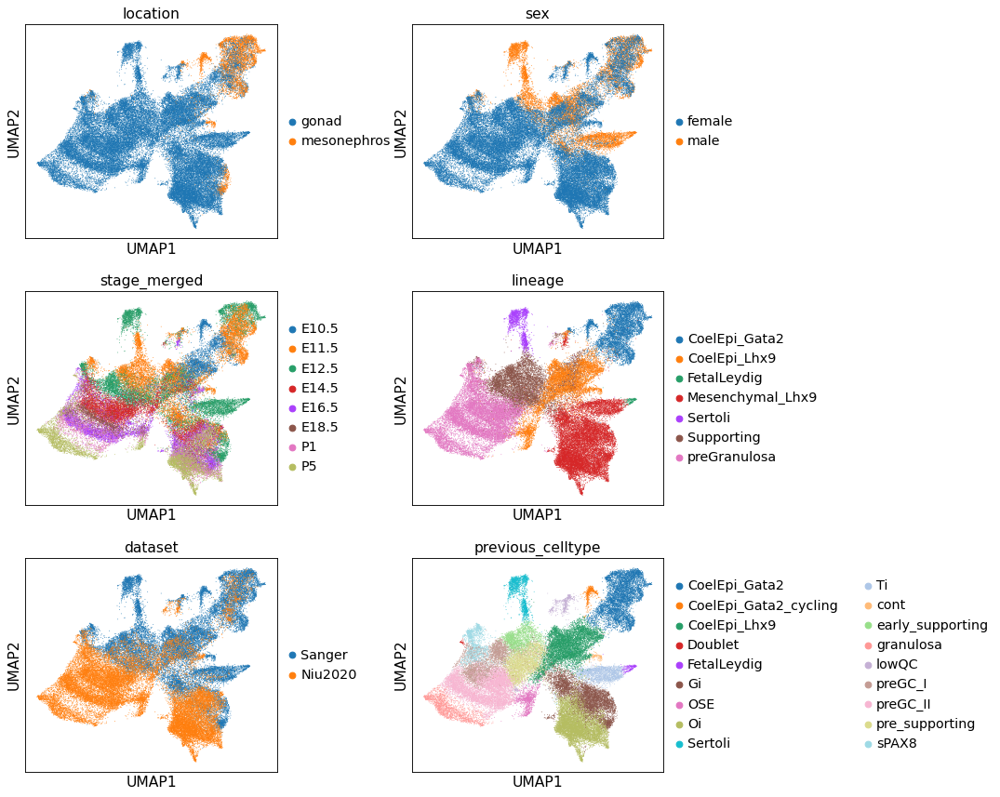

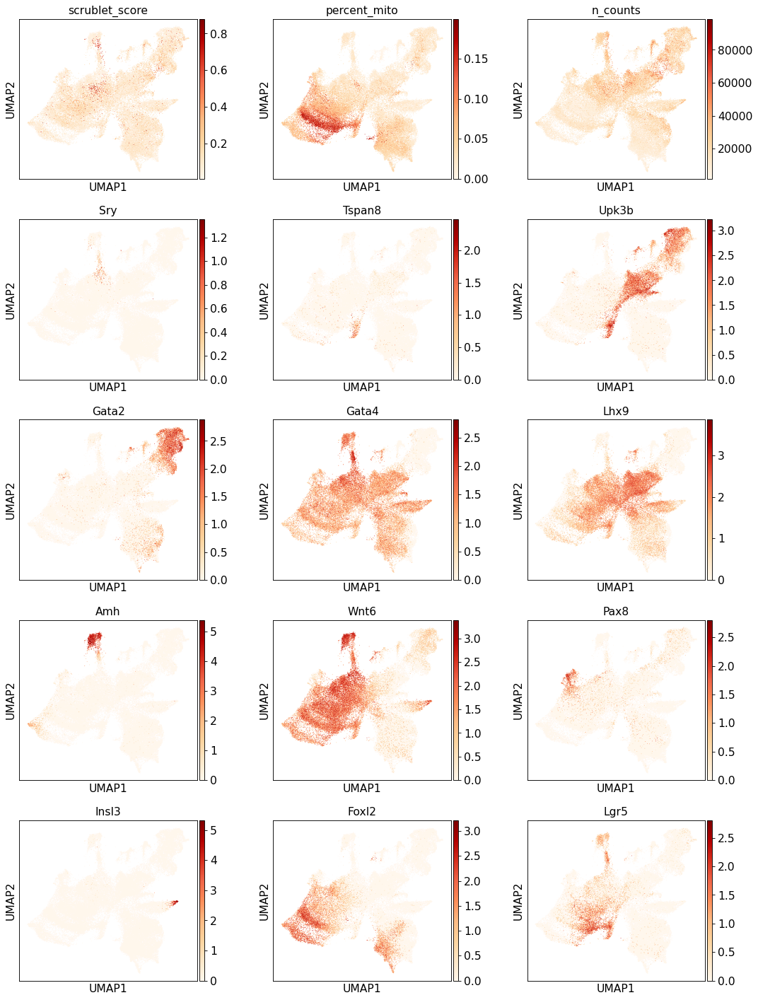

In [17]:
sc.pl.umap(
    adata,
    color=[ "location",  'sex', 'stage_merged', "lineage", 'dataset', 'previous_celltype'],
    frameon=True, ncols = 2, wspace = 0.4
)

sc.pl.umap(
    adata,
    color=['scrublet_score',  'percent_mito', 'n_counts',  'Sry',  'Tspan8','Upk3b','Gata2', 'Gata4', 'Lhx9',  'Amh',  'Wnt6', 'Pax8', 'Insl3','Foxl2',  'Lgr5'], color_map = "OrRd",
    frameon=True, ncols = 3, wspace = 0.3
)

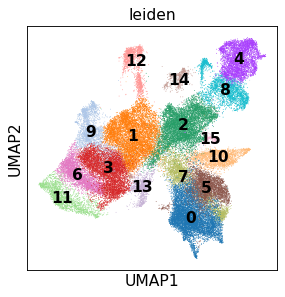

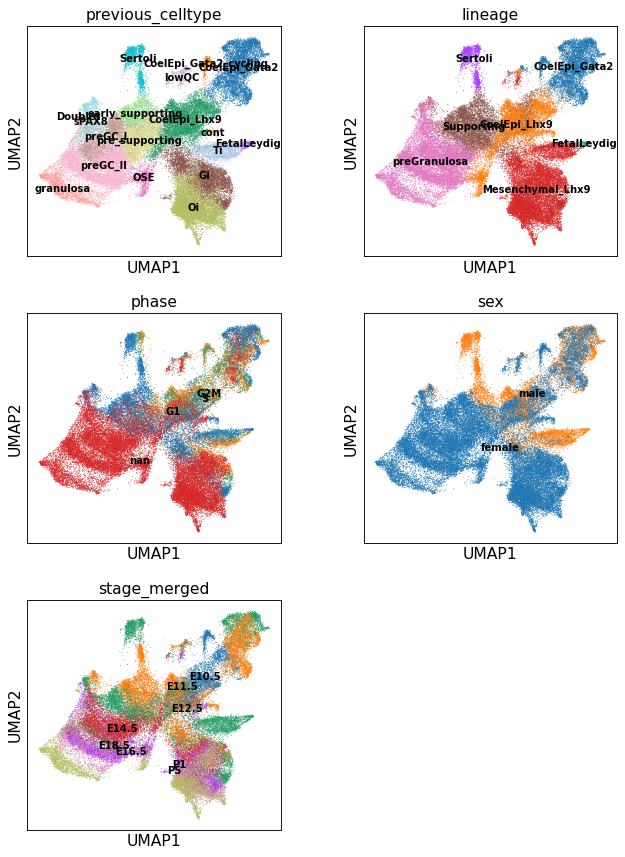

In [18]:
sc.tl.leiden(adata, resolution=1)
sc.pl.umap(
    adata,
    color=['leiden'], color_map = "OrRd",legend_loc='on data',
    frameon=True, ncols = 2, wspace = 0.3
)
sc.pl.umap(
    adata,
    color=['previous_celltype', 'lineage','phase', 'sex', 'stage_merged'], ncols = 2,
    legend_loc='on data', legend_fontsize=9
)

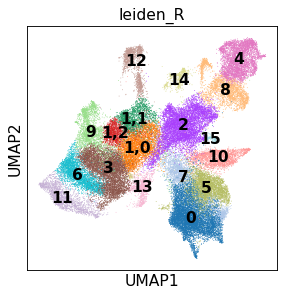

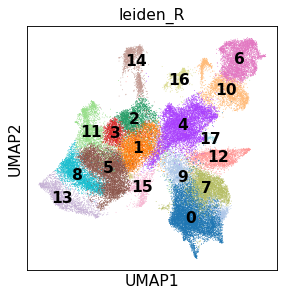

In [19]:
# release preGC_I and early supproting
sc.tl.leiden(adata, resolution=0.3, restrict_to=('leiden', ['1']))
sc.pl.umap(adata, color='leiden_R',legend_loc='on data')
adata.obs['leiden_R'].cat.categories = [str(i) for i in range(len(adata.obs['leiden_R'].cat.categories))]
sc.pl.umap(adata, color='leiden_R',legend_loc='on data')
adata.obs['leiden'] = adata.obs['leiden_R']

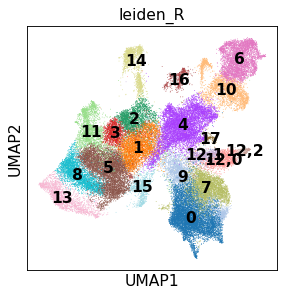

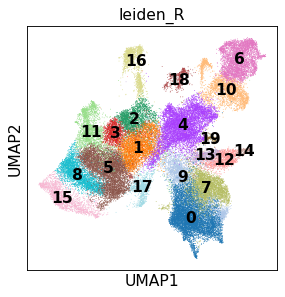

In [20]:
# release Leydig
sc.tl.leiden(adata, resolution=0.25, restrict_to=('leiden', ['12']))
sc.pl.umap(adata, color='leiden_R',legend_loc='on data')
adata.obs['leiden_R'].cat.categories = [str(i) for i in range(len(adata.obs['leiden_R'].cat.categories))]
sc.pl.umap(adata, color='leiden_R',legend_loc='on data')
adata.obs['leiden'] = adata.obs['leiden_R']

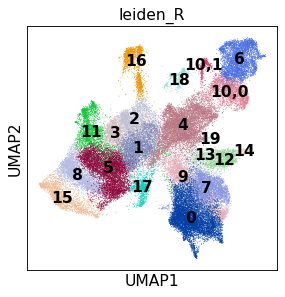

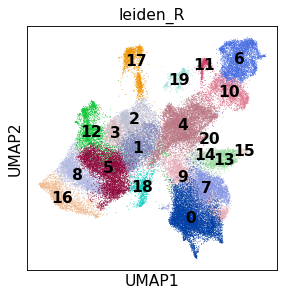

In [21]:
# release CoelEpi GATA2 contaminant
sc.tl.leiden(adata, resolution=0.2, restrict_to=('leiden', ['10']))
sc.pl.umap(adata, color='leiden_R',legend_loc='on data')
adata.obs['leiden_R'].cat.categories = [str(i) for i in range(len(adata.obs['leiden_R'].cat.categories))]
sc.pl.umap(adata, color='leiden_R',legend_loc='on data')
adata.obs['leiden'] = adata.obs['leiden_R']

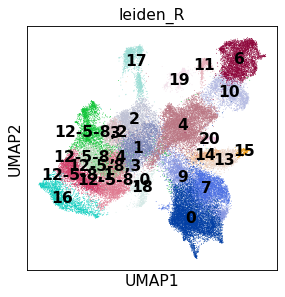

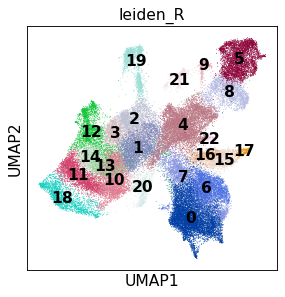

In [22]:
# clean sPAX8/pre_GC_I border
sc.tl.leiden(adata, resolution=0.4, restrict_to=('leiden', ['12', '5', '8']))
sc.pl.umap(adata, color='leiden_R',legend_loc='on data')
adata.obs['leiden_R'].cat.categories = [str(i) for i in range(len(adata.obs['leiden_R'].cat.categories))]
sc.pl.umap(adata, color='leiden_R',legend_loc='on data')
adata.obs['leiden'] = adata.obs['leiden_R']

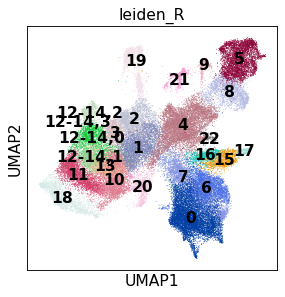

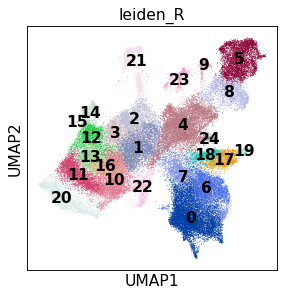

In [23]:
# clean sPAX8/pre_GC_I border
sc.tl.leiden(adata, resolution=0.5, restrict_to=('leiden', ['12', '14']))
sc.pl.umap(adata, color='leiden_R',legend_loc='on data')
adata.obs['leiden_R'].cat.categories = [str(i) for i in range(len(adata.obs['leiden_R'].cat.categories))]
sc.pl.umap(adata, color='leiden_R',legend_loc='on data')
adata.obs['leiden'] = adata.obs['leiden_R']

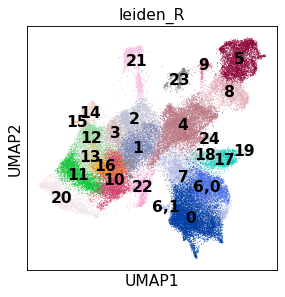

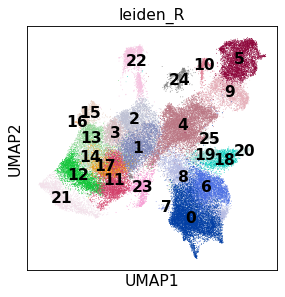

In [24]:
# clean contaminant at Gi
sc.tl.leiden(adata, resolution=0.175, restrict_to=('leiden', ['6']))
sc.pl.umap(adata, color='leiden_R',legend_loc='on data')
adata.obs['leiden_R'].cat.categories = [str(i) for i in range(len(adata.obs['leiden_R'].cat.categories))]
sc.pl.umap(adata, color='leiden_R',legend_loc='on data')
adata.obs['leiden'] = adata.obs['leiden_R']

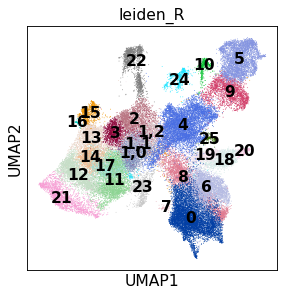

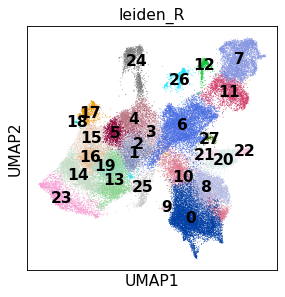

In [25]:
# clean preGC_I
sc.tl.leiden(adata, resolution=0.4, restrict_to=('leiden', ['1']))
sc.pl.umap(adata, color='leiden_R',legend_loc='on data')
adata.obs['leiden_R'].cat.categories = [str(i) for i in range(len(adata.obs['leiden_R'].cat.categories))]
sc.pl.umap(adata, color='leiden_R',legend_loc='on data')
adata.obs['leiden'] = adata.obs['leiden_R']

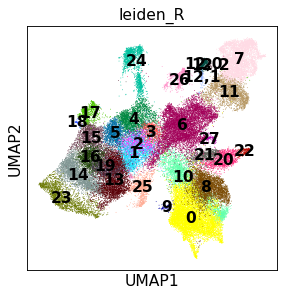

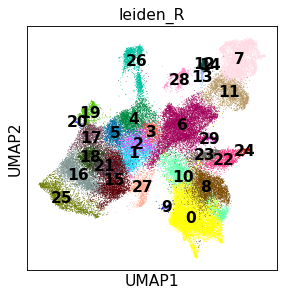

In [26]:
# clean preGC_I
sc.tl.leiden(adata, resolution=0.3, restrict_to=('leiden', ['12']))
sc.pl.umap(adata, color='leiden_R',legend_loc='on data')
adata.obs['leiden_R'].cat.categories = [str(i) for i in range(len(adata.obs['leiden_R'].cat.categories))]
sc.pl.umap(adata, color='leiden_R',legend_loc='on data')
adata.obs['leiden'] = adata.obs['leiden_R']

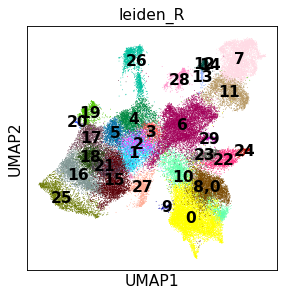

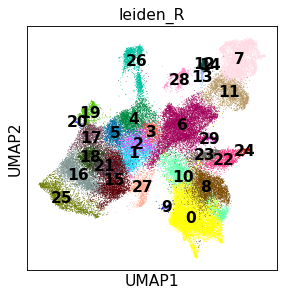

In [27]:
# clean preGC_I
sc.tl.leiden(adata, resolution=0.175, restrict_to=('leiden', ['8']))
sc.pl.umap(adata, color='leiden_R',legend_loc='on data')
adata.obs['leiden_R'].cat.categories = [str(i) for i in range(len(adata.obs['leiden_R'].cat.categories))]
sc.pl.umap(adata, color='leiden_R',legend_loc='on data')
adata.obs['leiden'] = adata.obs['leiden_R']

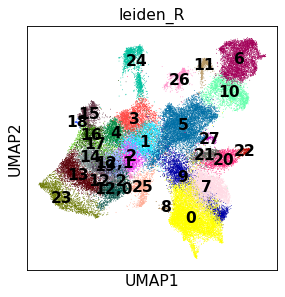

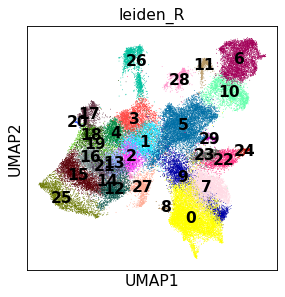

In [56]:
# clean preGC_I
sc.tl.leiden(adata, resolution=0.4, restrict_to=('leiden', ['12']))
sc.pl.umap(adata, color='leiden_R',legend_loc='on data')
adata.obs['leiden_R'].cat.categories = [str(i) for i in range(len(adata.obs['leiden_R'].cat.categories))]
sc.pl.umap(adata, color='leiden_R',legend_loc='on data')
# adata.obs['leiden'] = adata.obs['leiden_R']

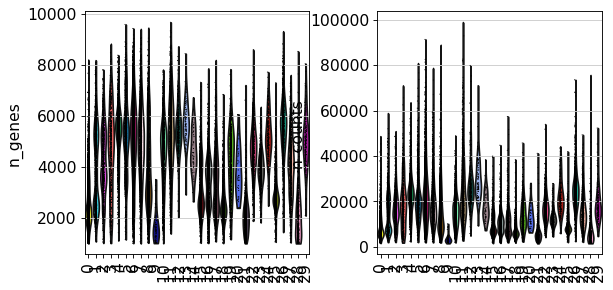

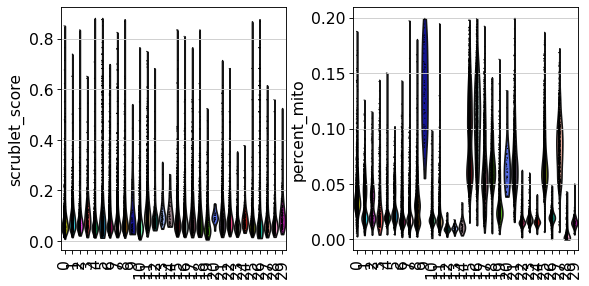

In [28]:
sc.pl.violin(adata, ['n_genes', 'n_counts'], groupby='leiden_R', rotation=90)
sc.pl.violin(adata, ['scrublet_score', 'percent_mito'], groupby='leiden_R', rotation=90)

## Markers

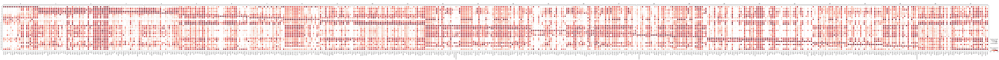

In [36]:
# sc.pp.scale(adata)
sc.tl.rank_genes_groups(adata, groupby='leiden', use_raw=False) #, method='logreg'
sc.pl.rank_genes_groups_dotplot(adata, n_genes=20, dendrogram=False, use_raw = False, standard_scale = 'var')

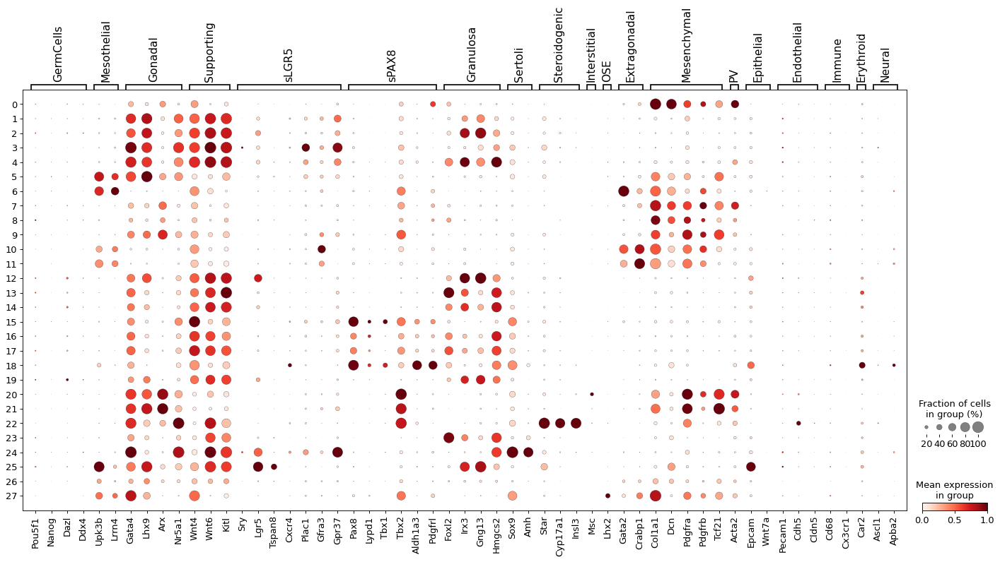

In [37]:
marker_genes = {'GermCells' : ['Pou5f1', 'Nanog', 'Dazl', 'Ddx4'], 
 'Mesothelial' : ['Upk3b', 'Lrrn4'], 
 'Gonadal' : ["Gata4", "Lhx9", 'Arx', 'Nr5a1'], 
 'Supporting' : ['Wnt4',  'Wnt6',  'Kitl'], 
 'sLGR5' : ['Sry', 'Lgr5', 'Tspan8', 'Cxcr4', 'Plac1', "Gfra3",'Gpr37'],
 'sPAX8' : ['Pax8', 'Lypd1', 'Tbx1', 'Tbx2', 'Aldh1a3', 'Pdgfrl'], 
 'Granulosa' : [ 'Foxl2', 'Irx3', 'Gng13','Hmgcs2'], 
 'Sertoli':['Sox9', 'Amh'],
 'Steroidogenic' : ['Star', 'Cyp17a1', 'Insl3'],
 'Interstitial' : ['Msc'],
 'OSE':['Lhx2'],
 'Extragonadal' : ['Gata2',   'Crabp1'], 
 'Mesenchymal' : ['Col1a1', 'Dcn', 'Pdgfra', 'Pdgfrb', 'Tcf21'],
 'PV':['Acta2'], 
 'Epithelial' : ['Epcam', 'Wnt7a'], 
 'Endothelial' : ['Pecam1', 'Cdh5', 'Cldn5'],
 'Immune' : ['Cd68', 'Cx3cr1'], 
 'Erythroid' : ['Car2'], 
 'Neural' : ['Ascl1', 'Apba2']
}
sc.pl.dotplot(adata, marker_genes, groupby='leiden', use_raw=False, standard_scale = 'var')

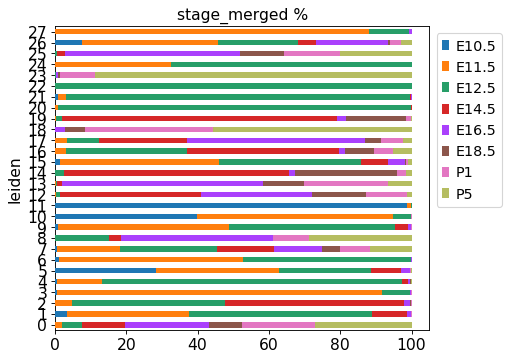

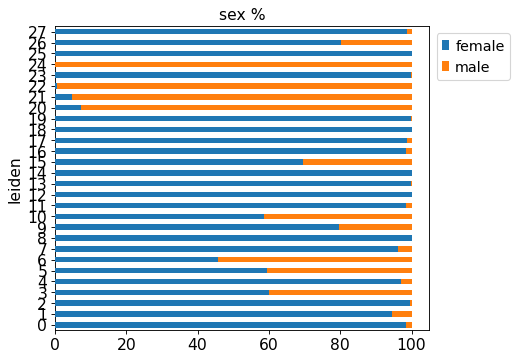

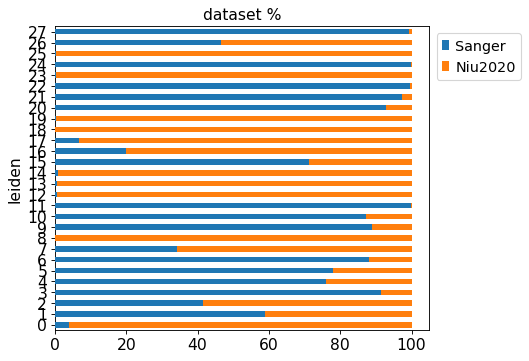

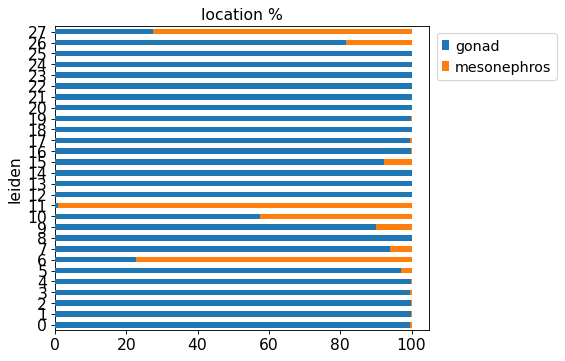

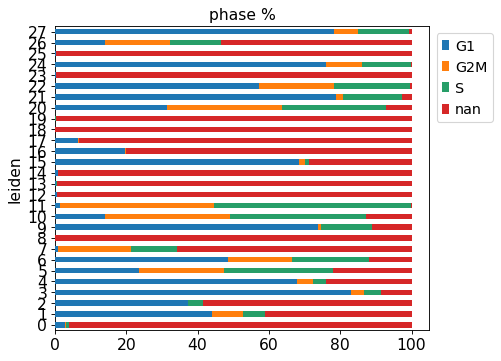

In [41]:
Barplot('stage_merged', adata, var='leiden', height=5)
Barplot('sex', adata, var='leiden', height=5)
Barplot('dataset', adata, var='leiden', height=5)
Barplot('location', adata, var='leiden', height=5)
Barplot('phase', adata, var='leiden', height=5)

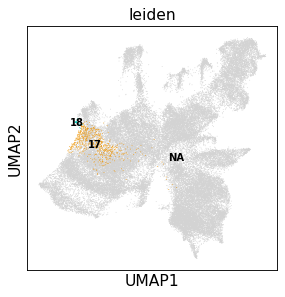

In [48]:
sc.pl.umap(
    adata,
    color=["leiden"], ncols = 3, groups=['18', '17'],
    legend_loc='on data', legend_fontsize=9
)

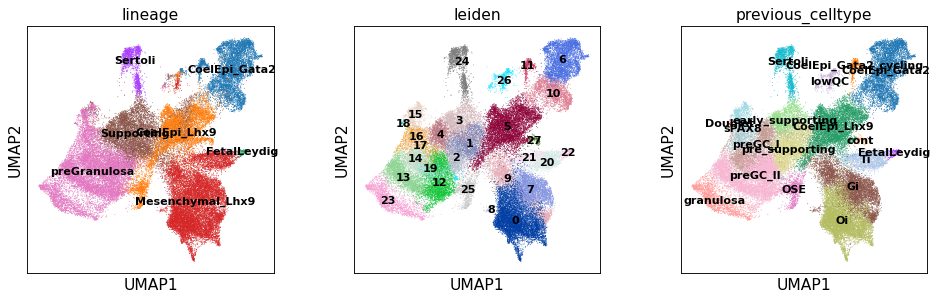

In [45]:
sc.pl.umap(
    adata,
    color=["lineage", 'leiden', 'previous_celltype'], ncols = 3,
    legend_loc='on data', legend_fontsize=10
)

... storing 'celltype' as categorical


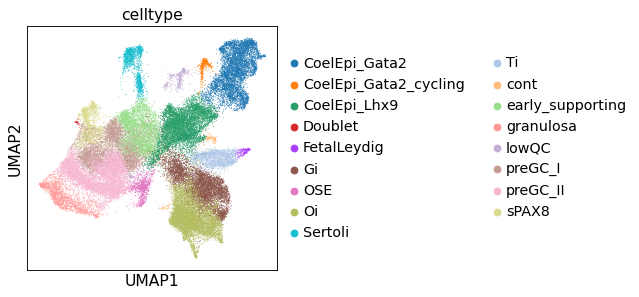

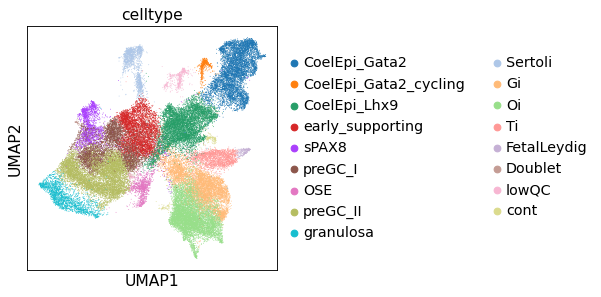

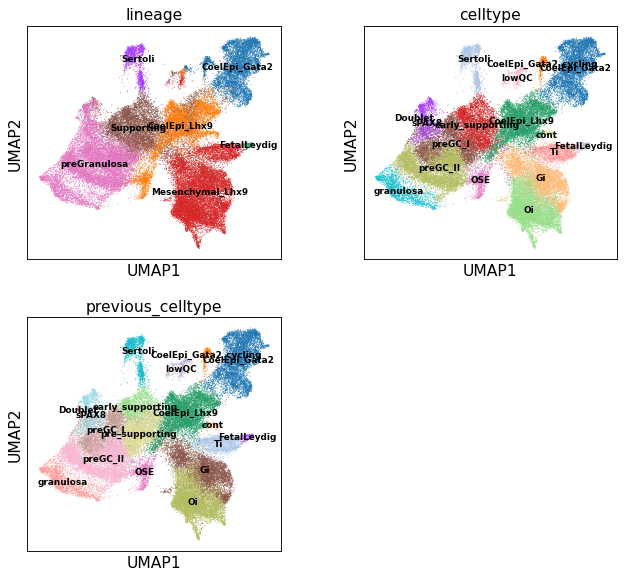

In [50]:
adata.obs['celltype'] = adata.obs['leiden'].tolist()
adata.obs.at[adata.obs['leiden'] == '0', 'celltype'] = 'Oi'
adata.obs.at[adata.obs['leiden'] == '1', 'celltype'] = 'early_supporting'
adata.obs.at[adata.obs['leiden'] == '2', 'celltype'] = 'preGC_I'
adata.obs.at[adata.obs['leiden'] == '3', 'celltype'] = 'early_supporting'
adata.obs.at[adata.obs['leiden'] == '4', 'celltype'] = 'preGC_I'
adata.obs.at[adata.obs['leiden'] == '5', 'celltype'] = 'CoelEpi_Lhx9'
adata.obs.at[adata.obs['leiden'] == '6', 'celltype'] = 'CoelEpi_Gata2'
adata.obs.at[adata.obs['leiden'] == '7', 'celltype'] = 'Gi'
adata.obs.at[adata.obs['leiden'] == '8', 'celltype'] = 'cont'
adata.obs.at[adata.obs['leiden'] == '9', 'celltype'] = 'Gi'
adata.obs.at[adata.obs['leiden'] == '10', 'celltype'] = 'CoelEpi_Gata2'
adata.obs.at[adata.obs['leiden'] == '11', 'celltype'] = 'CoelEpi_Gata2_cycling'
adata.obs.at[adata.obs['leiden'] == '12', 'celltype'] = 'preGC_II'
adata.obs.at[adata.obs['leiden'] == '13', 'celltype'] = 'preGC_II'
adata.obs.at[adata.obs['leiden'] == '14', 'celltype'] = 'preGC_I'
adata.obs.at[adata.obs['leiden'] == '15', 'celltype'] = 'sPAX8'
adata.obs.at[adata.obs['leiden'] == '16', 'celltype'] = 'sPAX8'
adata.obs.at[adata.obs['leiden'] == '17', 'celltype'] = 'preGC_I'
adata.obs.at[adata.obs['leiden'] == '18', 'celltype'] = 'Doublet'
adata.obs.at[adata.obs['leiden'] == '19', 'celltype'] = 'preGC_II'
adata.obs.at[adata.obs['leiden'] == '20', 'celltype'] = 'Ti'
adata.obs.at[adata.obs['leiden'] == '21', 'celltype'] = 'Ti'
adata.obs.at[adata.obs['leiden'] == '22', 'celltype'] = 'FetalLeydig'
adata.obs.at[adata.obs['leiden'] == '23', 'celltype'] = 'granulosa'
adata.obs.at[adata.obs['leiden'] == '24', 'celltype'] = 'Sertoli'
adata.obs.at[adata.obs['leiden'] == '25', 'celltype'] = 'OSE'
adata.obs.at[adata.obs['leiden'] == '26', 'celltype'] = 'lowQC'
adata.obs.at[adata.obs['leiden'] == '27', 'celltype'] = 'cont'
set(adata.obs['celltype'])
sc.pl.umap(adata, color=['celltype'])
adata.obs['celltype'].cat.reorder_categories(['CoelEpi_Gata2', 'CoelEpi_Gata2_cycling','CoelEpi_Lhx9',  'early_supporting', 'sPAX8',
                                              'preGC_I', 'OSE', 'preGC_II', 'granulosa','Sertoli',
                                             'Gi', 'Oi', 'Ti', 'FetalLeydig',                                              
                                               'Doublet',  'lowQC', 'cont'], inplace=True)

sc.pl.umap(adata, color=['celltype'])
sc.pl.umap(adata, color=['lineage', 'celltype', 'previous_celltype'], ncols = 2, legend_loc='on data', legend_fontsize=8)

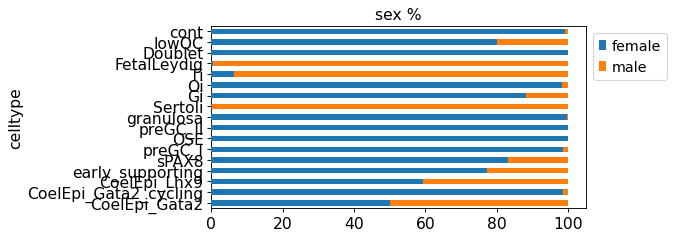

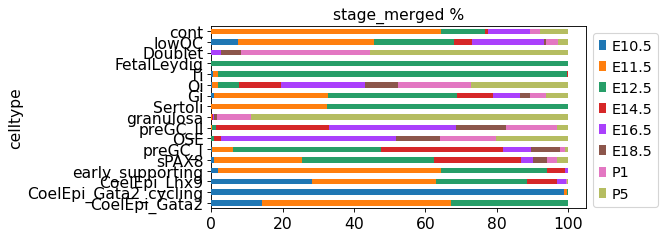

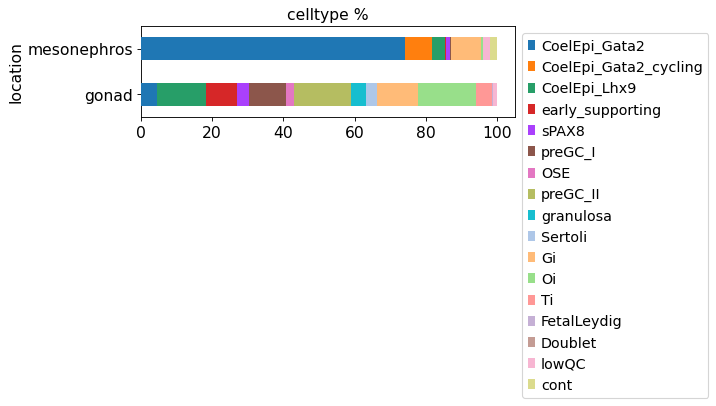

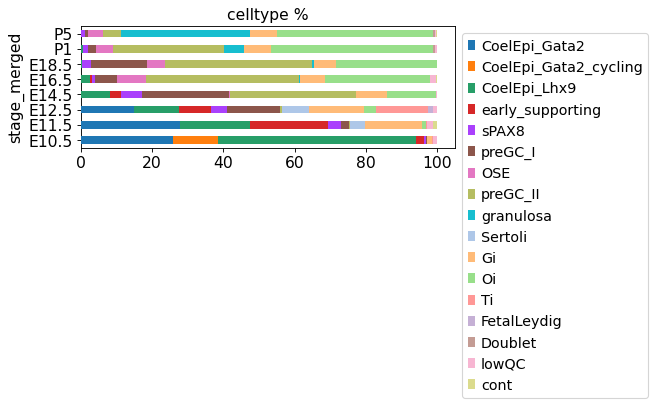

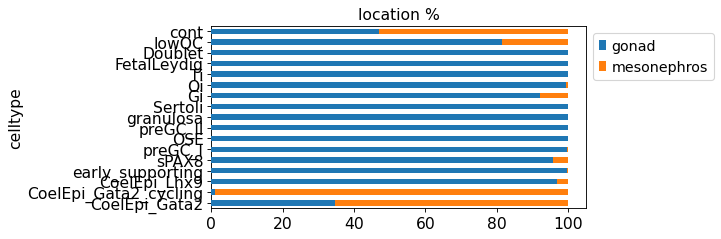

In [51]:
Barplot('sex', adata, var='celltype', height=3)
Barplot('stage_merged', adata, var='celltype', height=3)
Barplot('celltype', adata, var='location', height=1.5)
Barplot('celltype', adata, var='stage_merged', height=2)
Barplot('location', adata, var='celltype', height=3)

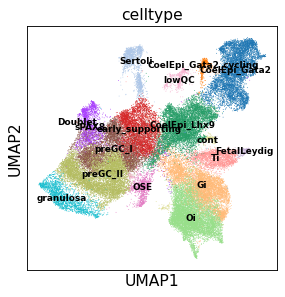

In [52]:
# del adata.uns['celltype_v1_colors']
# adata = adata[[i not in ['lowQC'] for i in adata.obs.celltype]]
sc.pl.umap(adata, color=['celltype'], ncols = 2, legend_loc='on data', legend_fontsize=8)

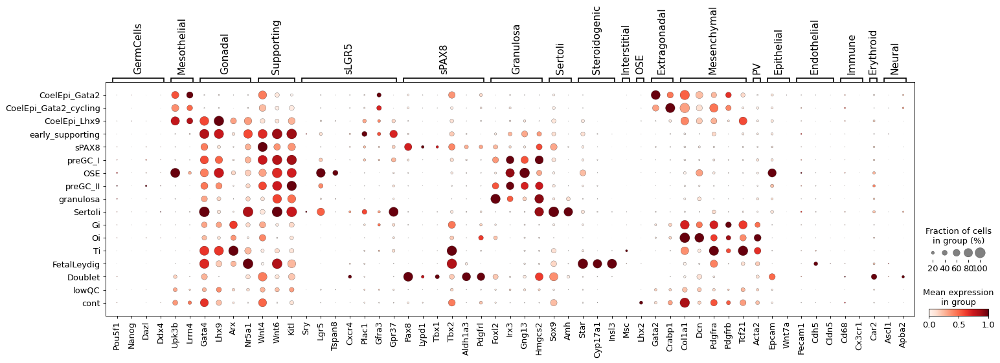

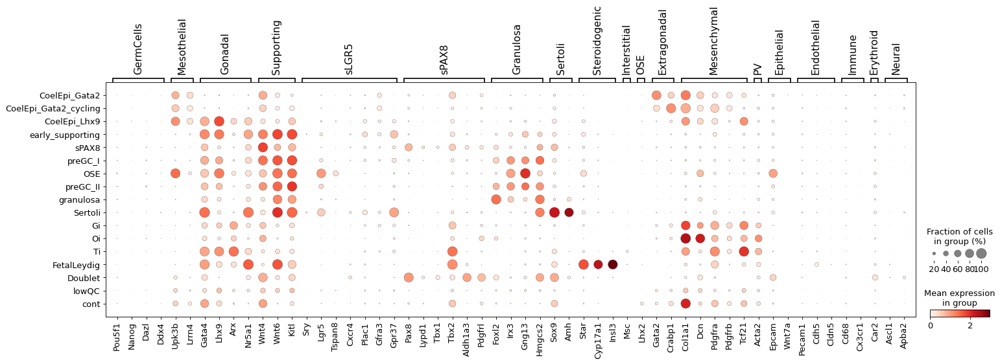

In [53]:
sc.pl.dotplot(adata, marker_genes, groupby='celltype', standard_scale = 'var')
sc.pl.dotplot(adata, marker_genes, groupby='celltype', use_raw=False)

## Save

In [54]:
adata.write(path_to_gonads+'/mouse-gonads_somatic.h5ad')
adata.obs.to_csv(path_to_gonads+'/mouse-gonads_somatic_annotated.csv')

## Visualize

/home/jovyan/my-conda-envs/sc_analysis/lib/python3.7/site-packages/pandas/core/arrays/categorical.py:2487: FutureWarning: The `inplace` parameter in pandas.Categorical.remove_unused_categories is deprecated and will be removed in a future version.
  res = method(*args, **kwargs)
Trying to set attribute `.uns` of view, copying.


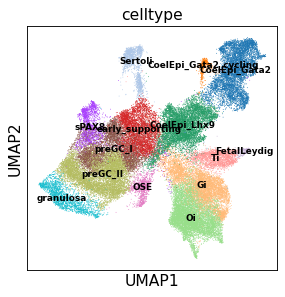

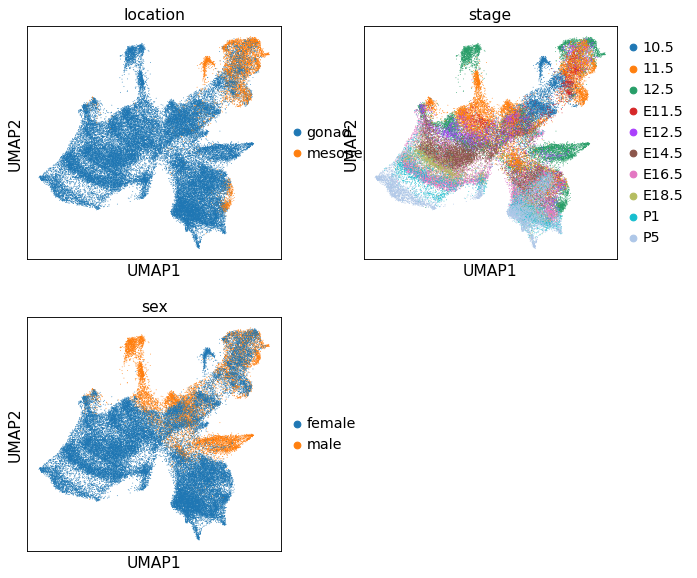

In [60]:
X = adata[[i not in ['lowQC', 'cont', 'Doublet'] for i in adata.obs.celltype]]
sc.pl.umap(X, color=['celltype'], ncols = 2, legend_loc='on data', legend_fontsize=8)
sc.pl.umap(X, color=['location', 'stage', 'sex'], ncols = 2)

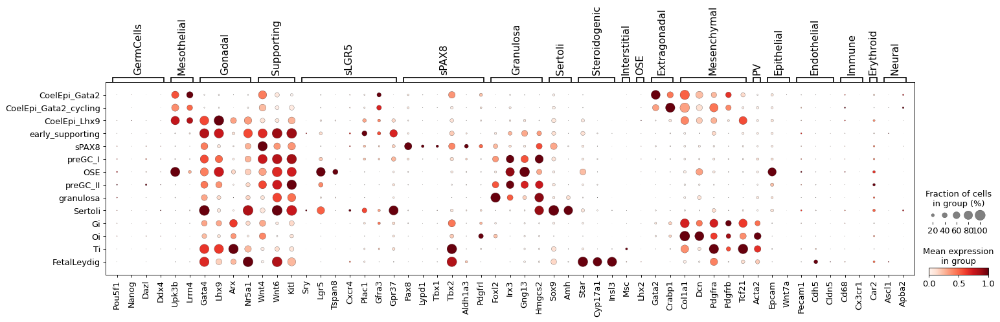

In [61]:
sc.pl.dotplot(X, marker_genes, groupby='celltype', standard_scale = 'var')

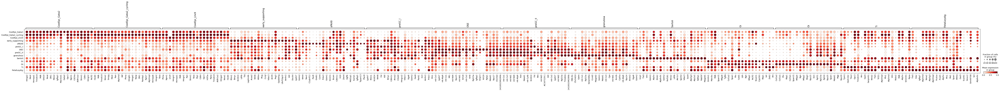

In [62]:
sc.tl.rank_genes_groups(X, groupby='celltype', use_raw=False) #, method='logreg'
sc.pl.rank_genes_groups_dotplot(X, n_genes=20, dendrogram=False, use_raw = False, standard_scale = 'var')

In [63]:
adata.obs['sex_celltype'] = adata.obs.apply(lambda x: '_'.join(x[[ 'celltype', 'sex']]),axis=1)

/home/jovyan/my-conda-envs/sc_analysis/lib/python3.7/site-packages/pandas/core/arrays/categorical.py:2487: FutureWarning: The `inplace` parameter in pandas.Categorical.remove_unused_categories is deprecated and will be removed in a future version.
  res = method(*args, **kwargs)
/home/jovyan/my-conda-envs/sc_analysis/lib/python3.7/site-packages/anndata/_core/anndata.py:1208: ImplicitModificationWarning: Initializing view as actual.
  "Initializing view as actual.", ImplicitModificationWarning
Trying to set attribute `.obs` of view, copying.
... storing 'sex_celltype' as categorical


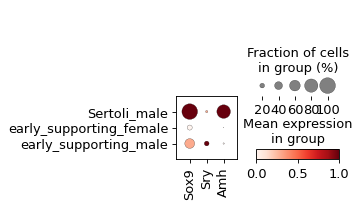

/home/jovyan/my-conda-envs/sc_analysis/lib/python3.7/site-packages/pandas/core/arrays/categorical.py:2487: FutureWarning: The `inplace` parameter in pandas.Categorical.remove_unused_categories is deprecated and will be removed in a future version.
  res = method(*args, **kwargs)
/home/jovyan/my-conda-envs/sc_analysis/lib/python3.7/site-packages/anndata/_core/anndata.py:1208: ImplicitModificationWarning: Initializing view as actual.
  "Initializing view as actual.", ImplicitModificationWarning
Trying to set attribute `.obs` of view, copying.
... storing 'sex_celltype' as categorical


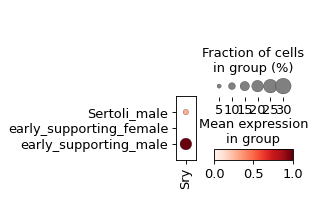

In [64]:
x = adata[[ i in ['Sertoli', 'early_supporting', 'early_somatic'] for i in adata.obs['celltype']]]
sc.pl.dotplot(x[[i not in 'Sertoli_female' for i in x.obs['sex_celltype']]], ['Sox9', 'Sry', 'Amh'], groupby='sex_celltype', standard_scale = 'var')
sc.pl.dotplot(x[[i not in 'Sertoli_female' for i in x.obs['sex_celltype']]], ['Sry'], groupby='sex_celltype', standard_scale = 'var')

/home/jovyan/my-conda-envs/sc_analysis/lib/python3.7/site-packages/pandas/core/arrays/categorical.py:2487: FutureWarning: The `inplace` parameter in pandas.Categorical.remove_unused_categories is deprecated and will be removed in a future version.
  res = method(*args, **kwargs)
/home/jovyan/my-conda-envs/sc_analysis/lib/python3.7/site-packages/anndata/_core/anndata.py:1208: ImplicitModificationWarning: Initializing view as actual.
  "Initializing view as actual.", ImplicitModificationWarning
Trying to set attribute `.obs` of view, copying.
... storing 'sex_celltype' as categorical


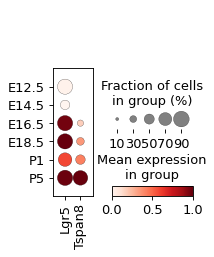

In [65]:
x = adata[[ i in ['OSE'] for i in adata.obs['celltype']]]
sc.pl.dotplot(x, ['Lgr5', 'Tspan8'], groupby='stage_merged', standard_scale = 'var')

In [66]:
import rpy2.rinterface_lib.callbacks
import logging
# Itoliste R warning messages
#Note: this can be commented out to get more verbose R output
rpy2.rinterface_lib.callbacks.logger.setLevel(logging.ERROR)
import anndata2ri
anndata2ri.activate()
%load_ext rpy2.ipython

In [67]:
%%R -o shared_genes

path = '/nfs/team292/lg18/with_valentina/gonadsV2_revision/'
mouse = read.csv(paste0(path,'mouse-gonads_somatic_TFIDF.tsv'), stringsAsFactors=F, sep = '\t')
sLGR5_mouse = subset(mouse, cluster == 'early_supporting')$gene
human = read.csv(paste0(path,'FCA-gonads_somatic_TFIDF.tsv'), stringsAsFactors=F, sep = '\t')
sLGR5_human = subset(human, cluster == 'early_supporting')$gene

shared_genes = intersect(toupper(sLGR5_mouse), sLGR5_human)

In [68]:
print(shared_genes)

[1] "SP3"     "PLAC1"   "GADD45G" "GPR37"   "RUNX1"   "STK24"   "CPA2"   
[8] "RALGPS2" "WNT6"   



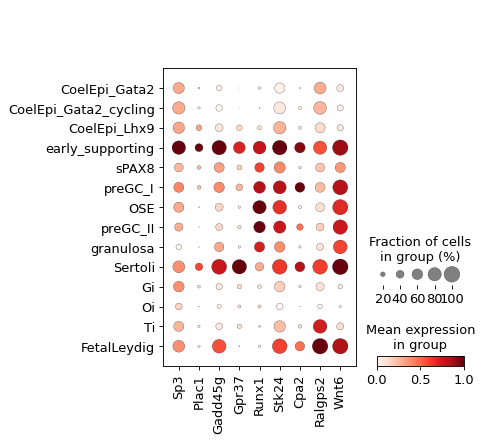

In [69]:
sc.pl.dotplot(X, ["Sp3","Plac1" , "Gadd45g", "Gpr37",   "Runx1",   "Stk24",   "Cpa2","Ralgps2", "Wnt6"  ], groupby='celltype', standard_scale = 'var')